### Imports

In [1]:
import os
from PIL import Image
import json
import numpy as np
import matplotlib.pyplot as plt
import cv2

import torch
from torch import nn
from torch import utils
from torch.utils.data import DataLoader, Dataset
from torch import optim

import torchvision
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision import transforms

print(torchvision.__version__)
device = torch.device('cuda:0')

0.12.0


## Dataset
Определяем датасет для использования его при обучении

In [2]:
class PassportDataset(Dataset):
    """ Custom dataset for data representation """
    def __init__(self, data_folder: str):
        self.data_folder = data_folder
        self.json_file_list = [file_name for file_name in os.listdir(data_folder) if '.json' in file_name]
        self.labels_list = [_, 'Surname', 'Name', 'Second Name']
        
    def __getitem__(self, ind: int):
        json_image_path = os.path.normpath(self.data_folder + f'/{self.json_file_list[ind]}')
        json_obj = json.load(open(json_image_path))
        
        # Load image
        img = Image.open(os.path.normpath(self.data_folder + f'/{json_obj["imagePath"]}')).convert("RGB")
        
        # Collect boxes and labels in lists
        boxes = list()
        labels = list()
        
        for item in json_obj['shapes']:
            # Append x_min, y_min, x_max, y_max
            boxes.append(item['points'][0] + item['points'][1])
            # Append box label
            labels.append(self.labels_list.index(item['label']))

        target_dict = {}
        
        boxes_tensor = torch.as_tensor(boxes, dtype=torch.float32)
        
        # Form target dictionary
        target_dict['boxes'] = boxes_tensor
        target_dict['labels'] = torch.as_tensor(labels, dtype=torch.int64)
        target_dict['image_id'] = torch.tensor(ind)
        target_dict['area'] = (boxes_tensor[:, 3] - boxes_tensor[:, 1]) * (boxes_tensor[:, 2] - boxes_tensor[:, 0])
        target_dict['iscrowd'] = torch.zeros((boxes_tensor.shape[0],), dtype=torch.int64)
        
        return img, target_dict
    
    def __len__(self):
        return len(self.json_file_list)

In [3]:
train_ds = PassportDataset('../input/ruspassportdataset/train/')
test_ds = PassportDataset('../input/ruspassportdataset/test/')

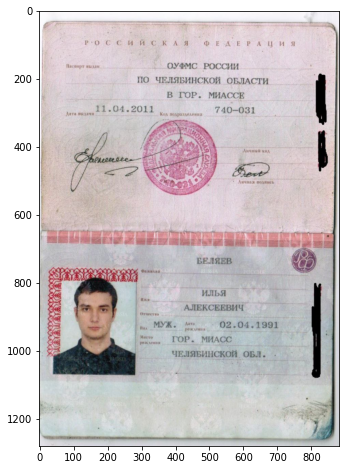

In [4]:
plt.figure(figsize=(12, 8))
plt.imshow(train_ds[1][0])

## Model definition
Определяем модель **Faster RCNN**, у которой заменяем последние полносвязные слои и обучаем для нашей задачи

In [5]:
def get_model(train_ds: PassportDataset):
    """ Returns new instance for the model """
    model = torchvision.models.detection.fasterrcnn_resnet50_fpn()

    num_classes = len(train_ds.labels_list)
    in_features = model.roi_heads.box_predictor.cls_score.in_features

    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)
    
    return model

In [6]:
# Utils functions
def collate_fn(batch):
    return tuple(zip(*batch))

In [7]:
model = get_model(train_ds)

Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth


  0%|          | 0.00/97.8M [00:00<?, ?B/s]

In [8]:
%%time
# Test values
data_loader = torch.utils.data.DataLoader(train_ds, batch_size=2, shuffle=True, collate_fn=collate_fn)

convert_image = transforms.ToTensor()

# For Training
images, targets = next(iter(data_loader))
images = list((convert_image(image) for image in images))
targets = [{k: v for k, v in t.items()} for t in targets]

model.train()
output = model(images, targets)   # Returns losses and detections

# For inference
model.eval()
x = [torch.rand(3, 300, 400), torch.rand(3, 500, 400)]
predictions = model(x)           # Returns predictions

CPU times: user 19.7 s, sys: 7.76 s, total: 27.4 s
Wall time: 27.7 s


In [9]:
model = get_model(train_ds)

In [10]:
%%time
# Test values
data_loader = torch.utils.data.DataLoader(train_ds, batch_size=4, num_workers=2, shuffle=True, collate_fn=collate_fn)

convert_image = transforms.ToTensor()

# For Training
images, targets = next(iter(data_loader))
images = list((convert_image(image).to(device) for image in images))
targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

model.to(device)


model.train()

output = model(images, targets)   # Returns losses and detections

# For inference
model.eval()
x = [torch.rand(3, 300, 400).to(device), torch.rand(3, 500, 400).to(device)]
predictions = model(x)           # Returns predictions

CPU times: user 2.34 s, sys: 1.5 s, total: 3.84 s
Wall time: 10.2 s


## Model training

Определяем алгоритм для тренировки модели, предусмотрев модификацию алгоритма с помощью изменяющегося learning rate, который контролируется с помощью объекта scheduler

In [11]:
def train(model: nn.Module, train_loader: DataLoader, test_loader: DataLoader, optimizer: optim.Optimizer, epoch_num: int, scheduler):
    classifier_loss_history = list()
    regression_loss_history = list()
    
    fig, axes = plt.subplots(1, 2, figsize=(20, 12))
    
    axes[0].set_xlabel('Epoch')
    axes[1].set_xlabel('Epoch')
    
    axes[0].set_ylabel('Loss')
    axes[1].set_ylabel('Loss')
    
    axes[0].grid()
    axes[1].grid()
    
    axes[0].set_title('Classifier loss')
    axes[1].set_title('Box regression loss')
    
    model.to(device)
    for epoch_step in range(epoch_num):
        model.train()
        
        res_loss_dict = {
            'loss_classifier': torch.tensor(0, dtype=torch.float, requires_grad=False), 
            'loss_box_reg': torch.tensor(0, dtype=torch.float, requires_grad=False), 
            'loss_objectness': torch.tensor(0, dtype=torch.float, requires_grad=False), 
            'loss_rpn_box_reg': torch.tensor(0, dtype=torch.float, requires_grad=False),
        }
        
        for step, (imgs, targets) in enumerate(train_loader, 1):
            convert_image = transforms.ToTensor()

            images = list((convert_image(image).to(device) for image in imgs))
            targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
            
            loss_dict = model(images, targets)
            
            losses = sum(loss for loss in loss_dict.values())
            
            optimizer.zero_grad()
            
            losses.backward()
            optimizer.step()
            
            for key in loss_dict:
                res_loss_dict[key] += loss_dict[key].to(torch.device('cpu')).detach() / len(train_loader)
                
        if scheduler:
            scheduler.step()
        
        classifier_loss_history.append(res_loss_dict['loss_classifier'])
        regression_loss_history.append(res_loss_dict['loss_box_reg'])
        
        print(f'Classifier loss: {res_loss_dict["loss_classifier"]} Box reg loss: {res_loss_dict["loss_box_reg"]}')
    
    axes[0].plot(list(range(1, epoch_num + 1)), classifier_loss_history)
    axes[1].plot(list(range(1, epoch_num + 1)), regression_loss_history)
    
    return classifier_loss_history, regression_loss_history

In [12]:
model = get_model(train_ds)

train_loader = DataLoader(train_ds, batch_size=2, num_workers=2, shuffle=True, collate_fn=collate_fn)
test_loader = DataLoader(test_ds, batch_size=2, num_workers=2, shuffle=True, collate_fn=collate_fn)

params = [p for p in model.parameters() if p.requires_grad]
optimizer = optim.SGD(params, lr=0.01, momentum=0.9, weight_decay=0.0005)
scheduler = optim.lr_scheduler.LinearLR(optimizer, start_factor=1.0, end_factor=0.1, total_iters=8)

torch.cuda.empty_cache()

Classifier loss: 0.22004961967468262 Box reg loss: 0.021850600838661194
Classifier loss: 0.11109278351068497 Box reg loss: 0.05686106160283089
Classifier loss: 0.13735319674015045 Box reg loss: 0.09166219830513
Classifier loss: 0.15165571868419647 Box reg loss: 0.11559881269931793
Classifier loss: 0.13678313791751862 Box reg loss: 0.1066734716296196
Classifier loss: 0.11986839026212692 Box reg loss: 0.09534358978271484
Classifier loss: 0.09768760949373245 Box reg loss: 0.08033166080713272
Classifier loss: 0.09015905112028122 Box reg loss: 0.08152581006288528
Classifier loss: 0.08043825626373291 Box reg loss: 0.07376367598772049
Classifier loss: 0.07418765127658844 Box reg loss: 0.07485827803611755
Classifier loss: 0.06826973706483841 Box reg loss: 0.07038647681474686
Classifier loss: 0.07298977673053741 Box reg loss: 0.07227248698472977
Classifier loss: 0.06302917748689651 Box reg loss: 0.06982329487800598
Classifier loss: 0.05485241487622261 Box reg loss: 0.0661926418542862
Classifier

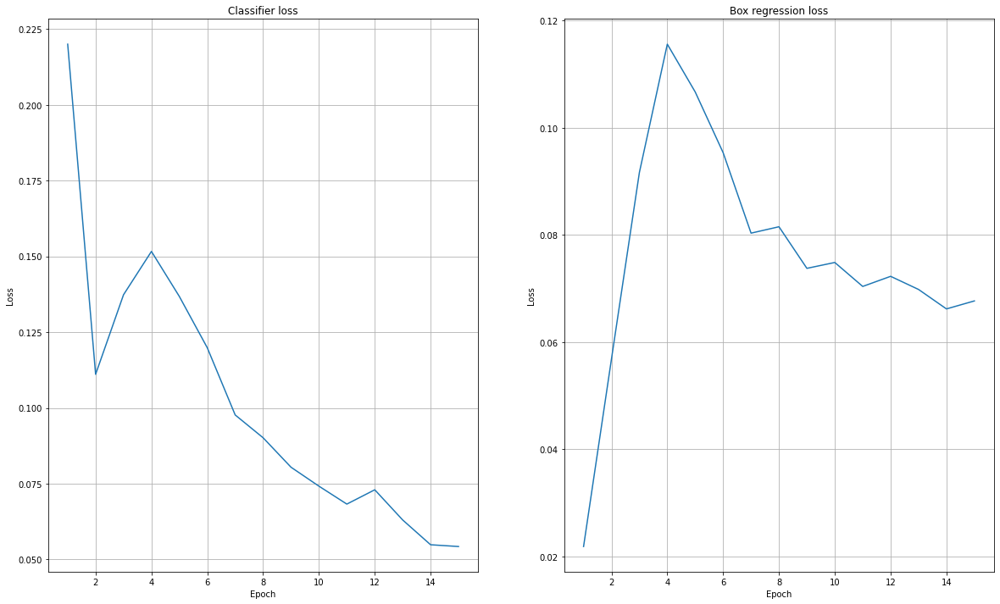

In [13]:
%%time
res = train(model, train_loader, test_loader, optimizer, 15, scheduler)

### Сохраняем модель

In [14]:
import pickle
import datetime

with open('trained_model_' + datetime.datetime.now().strftime('%M_%d_%s'), mode='wb') as file:
    pickle.dump(model, file)

## Демонстрация результатов

In [15]:
def show_model_prediction(model: nn.Module, dataset: PassportDataset):
    data_loader = torch.utils.data.DataLoader(dataset, batch_size=4, num_workers=2, shuffle=True, collate_fn=collate_fn)
    
    img_count = len(dataset)
    
    fig, axes = plt.subplots(img_count, 2, gridspec_kw={'width_ratios': [4, 1]}, figsize=(24, img_count * 20))
    
    model.eval()
    
    img_convert = transforms.ToTensor()
    
    plt_ind = 0
    
    for img_batch, target_batch in data_loader:        
        prep_img_batch = list((img_convert(img).to(device) for img in img_batch))        
        
        outputs = model(prep_img_batch)

        
        ##########################
        for temp_image, mod_answer in zip(img_batch, outputs):

            kept_ind = torchvision.ops.nms(mod_answer['boxes'], mod_answer['scores'], 0.4)            
            
            mod_answer['boxes'] = mod_answer['boxes'][kept_ind]
            mod_answer['labels'] = mod_answer['labels'][kept_ind]
            mod_answer['scores'] = mod_answer['scores'][kept_ind]
            
            conf_ans_ind = mod_answer['scores'] >= 0.65
            
            mod_answer['boxes'] = mod_answer['boxes'][conf_ans_ind]
            mod_answer['labels'] = mod_answer['labels'][conf_ans_ind]
            mod_answer['scores'] = mod_answer['scores'][conf_ans_ind]
            
#             mod_answer = mod_answer[list(np.array(kept_ind.cpu()))]
            

            temp_image = np.array(temp_image)
            # Convert RGB to BGR 
            temp_image = temp_image[:, :, ::-1].copy() 

            for box_ind, (box, label) in enumerate(zip(mod_answer['boxes'], mod_answer['labels']), 1):
                # unpack the bounding box
                x0 = int(box[0])
                y0 = int(box[1])
                x1 = int(box[2])
                y1 = int(box[3])
                

                cv2.rectangle(temp_image, (x0, y0), (x1, y1), (0, 0, 255), 1)
                cv2.putText(temp_image, str(box_ind), ((x0 + x1) // 2, (y0 + y1) // 2), 
                            cv2.FONT_HERSHEY_COMPLEX, 0.6, (0, 255, 0))

                axes[plt_ind, 1].text(0, 1 - box_ind / len(mod_answer['boxes']), 
                                      f'{box_ind} -> {dataset.labels_list[label]}', fontsize=15, transform=axes[plt_ind, 1].transAxes)


            img_obj = cv2.cvtColor(temp_image, cv2.COLOR_BGR2RGB)

            img_width, img_height, _ = img_obj.shape

            cv2.resize(img_obj, (int(3 * img_width), int(3 * img_height)))

            axes[plt_ind, 0].imshow(img_obj)
            axes[plt_ind, 1].axis('off')
            plt_ind += 1
        
    plt.show()

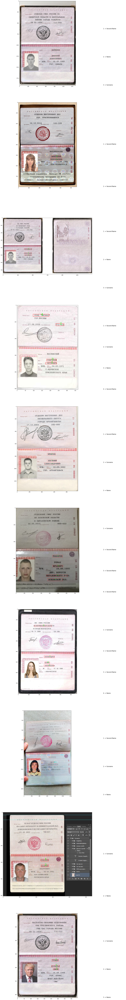

CPU times: user 7.74 s, sys: 846 ms, total: 8.59 s
Wall time: 8.51 s


In [16]:
%%time
show_model_prediction(model.to(device), test_ds)

## Генерируем примеры для тренировки модели распознавания

In [17]:
def save_boxes_result(dataset: PassportDataset, folder_name: str):
    ind = 0
    
    data_loader = torch.utils.data.DataLoader(dataset, batch_size=2, num_workers=2, shuffle=False, collate_fn=collate_fn)
    
    model.eval()
    img_convert = transforms.ToTensor()
    
    for img_batch, target_batch in data_loader:
        torch.cuda.empty_cache()
        prep_img_batch = list((img_convert(img).to(device) for img in img_batch))
        outputs = model(prep_img_batch)
        
        for temp_image, mod_answer in zip(img_batch, outputs):

            kept_ind = torchvision.ops.nms(mod_answer['boxes'], mod_answer['scores'], 0.2)            
            
            mod_answer['boxes'] = mod_answer['boxes'][kept_ind]
            mod_answer['labels'] = mod_answer['labels'][kept_ind]
            mod_answer['scores'] = mod_answer['scores'][kept_ind]
            
            conf_ans_ind = mod_answer['scores'] >= 0.65
            
            mod_answer['boxes'] = mod_answer['boxes'][conf_ans_ind]
            mod_answer['labels'] = mod_answer['labels'][conf_ans_ind]
            mod_answer['scores'] = mod_answer['scores'][conf_ans_ind]
            

            temp_image = np.array(temp_image)
            # Convert RGB to BGR 
            temp_image = temp_image[:, :, ::-1].copy() 

            for box_ind, (box, label) in enumerate(zip(mod_answer['boxes'], mod_answer['labels']), 1):
                # unpack the bounding box
                x0 = int(box[0])
                y0 = int(box[1])
                x1 = int(box[2])
                y1 = int(box[3])
                
                cropped_image = temp_image[y0:y1, x0:x1]
                
                cv2.imwrite(os.path.normpath(folder_name + f'img_{ind}.png'), cropped_image)
                
                ind += 1

In [18]:
%%time
save_boxes_result(train_ds, '')

CPU times: user 7.98 s, sys: 2.1 s, total: 10.1 s
Wall time: 11.4 s


Сохраняем результаты в zip архив для обучения модели распознавания

In [19]:
#!mkdir img_folder
#!mv $(ls | grep img) img_folder 
#import shutil
#shutil.make_archive('zipped_images', 'zip', 'img_folder')